In [51]:
import pandas as pd

data = pd.read_csv('/mnt/d/jnp3/zaddom1/mimuwml2021/bank-classification.csv')
data[0:5]


,id,birth_date,job,marital,education,default,housing,loan,contact_date,contact,campaign,pdays,previous,poutcome,y
0,1,1952-03-23,housemaid,married,basic.4y,no,no,no,2008-05-12,telephone,1,999,0,nonexistent,no
1,2,1951-03-24,services,married,high.school,unknown,no,no,2008-05-26,telephone,1,999,0,nonexistent,unknown
2,3,1971-05-19,services,married,high.school,no,yes,no,2008-05-05,telephone,1,999,0,nonexistent,no
3,4,1968-01-24,admin.,married,basic.6y,no,no,no,2008-05-19,telephone,1,999,0,nonexistent,unknown
4,5,1952-05-11,services,married,high.school,no,no,yes,2008-05-19,telephone,1,999,0,nonexistent,unknown


Zaczynam od zamiany wszystkich danych na liczby. Daty zamieniam na liczby, a kolumny ze string'ami i wartościami 0/1 koduję onehot (w tym unknown).
Dodaję jako feature dzień tygodnia, kiedy nawiązany był kontakt. 

In [52]:
import datetime
import time
from sklearn import preprocessing

data['day_of_week'] = data.contact_date \
    .apply(lambda x : datetime.datetime.strptime(x, "%Y-%m-%d").weekday())
data.birth_date = data.birth_date \
    .apply(lambda x : time.mktime(datetime.datetime.strptime(x, "%Y-%m-%d").timetuple()))
data.contact_date = data.contact_date \
    .apply(lambda x : time.mktime(datetime.datetime.strptime(x, "%Y-%m-%d").timetuple()))

data.birth_date =(data.birth_date-data.birth_date.mean()) / data.birth_date.std() * 10
data.contact_date =(data.contact_date-data.contact_date.mean()) / data.contact_date.std() * 10

data[0:5]

,id,birth_date,job,marital,education,default,housing,loan,contact_date,contact,campaign,pdays,previous,poutcome,y,day_of_week
0,1,-15.953501,housemaid,married,basic.4y,no,no,no,-9.211846,telephone,1,999,0,nonexistent,no,0
1,2,-16.911939,services,married,high.school,unknown,no,no,-8.536623,telephone,1,999,0,nonexistent,unknown,0
2,3,2.417007,services,married,high.school,no,yes,no,-9.549458,telephone,1,999,0,nonexistent,no,0
3,4,-0.762908,admin.,married,basic.6y,no,no,no,-8.874235,telephone,1,999,0,nonexistent,unknown,0
4,5,-15.824833,services,married,high.school,no,no,yes,-8.874235,telephone,1,999,0,nonexistent,unknown,0


In [53]:
def onehot_column(data : pd.DataFrame, col_name):
    onehot = pd.get_dummies(data[col_name])
    new_cols = [f'{col_name}_{label}' for label in onehot.columns]
    data[new_cols] = onehot
    data.drop(col_name, inplace=True, axis=1)


In [54]:
onehot_column(data, 'marital')
onehot_column(data, 'job')
onehot_column(data, 'education')
onehot_column(data, 'contact')
onehot_column(data, 'poutcome')
onehot_column(data, 'default')
onehot_column(data, 'housing')
onehot_column(data, 'loan')
onehot_column(data, 'day_of_week')

data[0:5]

,id,birth_date,contact_date,campaign,pdays,previous,y,marital_divorced,marital_married,marital_single,...,housing_unknown,housing_yes,loan_no,loan_unknown,loan_yes,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4
0,1,-15.953501,-9.211846,1,999,0,no,0,1,0,...,0,0,1,0,0,1,0,0,0,0
1,2,-16.911939,-8.536623,1,999,0,unknown,0,1,0,...,0,0,1,0,0,1,0,0,0,0
2,3,2.417007,-9.549458,1,999,0,no,0,1,0,...,0,1,1,0,0,1,0,0,0,0
3,4,-0.762908,-8.874235,1,999,0,unknown,0,1,0,...,0,0,1,0,0,1,0,0,0,0
4,5,-15.824833,-8.874235,1,999,0,unknown,0,1,0,...,0,0,0,0,1,1,0,0,0,0


In [55]:
def yes_no_encode(data, column_name):
    ''' enkoduje yes na 1, no na 0, a unknown na średnią znanych wartości w kolumnie. '''
    n_yes = len(data[data[column_name].eq('yes')])
    n_no= len(data[data[column_name].eq('no')])
    avg = n_yes / (n_yes + n_no)
    map_vals = {'no' : 0, 'yes' : 1, 'unknown' : avg}
    data[column_name] = data[column_name].map(map_vals)

data[0:5]

,id,birth_date,contact_date,campaign,pdays,previous,y,marital_divorced,marital_married,marital_single,...,housing_unknown,housing_yes,loan_no,loan_unknown,loan_yes,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4
0,1,-15.953501,-9.211846,1,999,0,no,0,1,0,...,0,0,1,0,0,1,0,0,0,0
1,2,-16.911939,-8.536623,1,999,0,unknown,0,1,0,...,0,0,1,0,0,1,0,0,0,0
2,3,2.417007,-9.549458,1,999,0,no,0,1,0,...,0,1,1,0,0,1,0,0,0,0
3,4,-0.762908,-8.874235,1,999,0,unknown,0,1,0,...,0,0,1,0,0,1,0,0,0,0
4,5,-15.824833,-8.874235,1,999,0,unknown,0,1,0,...,0,0,0,0,1,1,0,0,0,0


Normalizuję kolumnę pdays i dodaję kolumnę, która koduje, czy wartość w pdays w danym wierszu oznacza brak nawiązania wcześniej kontaktu (pdays = 999).

In [56]:
data['max_pdays'] = data.pdays \
    .apply(lambda x : 1 if x == 999 else 0)
data.pdays = data.pdays \
    .apply(lambda x : x / 999)

In [57]:
def split_data(data):
    ''' Dzieli dane na te ze znanym i z nieznanym label'em '''
    data_known = data[data.y != "unknown"]
    data_unknown = data[data.y == "unknown"]
    data_known.y = data_known.y.map({'no' : 0, 'yes' : 1})

    return data_known, data_unknown

In [58]:
def add_distances_to_labels(data):
    ''' Tworzy nowy Dataframe z dodatkowymi kolumnami.
        Dla każdej kolumny w starym Dataframe'ie powstają dwie nowe,
        z odległościami do średnich wartości w negatywnych i pozytywnych przykładach. '''
    data_positive = data[data.y == 'yes']
    data_negative = data[data.y == 'no']

    describe = data[data.y != 'unknown'].describe()
    describe_pos = data_positive.describe()
    describe_neg = data_negative.describe()
    
    new_data = data.copy()
    # Compute the distance to the average positive/negative case for each column
    for col in data.columns:
        if col != 'id' and col != 'y':
            new_col_pos = data[col].apply(lambda x : abs(x - describe_pos[col]['mean']))
            new_col_neg = data[col].apply(lambda x : abs(x - describe_neg[col]['mean']))
            new_data[f'{col}_pos_dist'] = new_col_pos
            new_data[f'{col}_neg_dist'] = new_col_neg
    
    return new_data

In [59]:
def prepare_train_data(data):
    '''
        Dzieli dane na znane i szukane. Usuwa kolumnę id i y ze znanych danych.
    '''
    data_known, data_unknown = split_data(data)

    data_known.drop('id', inplace=True, axis=1)
    ids = data_unknown.pop('id')
    data_unknown.drop('y', inplace=True, axis=1)

    data_known = data_known.sample(frac=1, random_state=147)
    labels = data_known.pop('y')

    return data_known, labels, data_unknown, ids

Użyję prostego modelu xgboost, do sprawdzenia, które feature'y nie przydają się w wykonywaniu predykcji.

In [60]:
import xgboost as xgb
data_known, labels, data_unknown, ids = prepare_train_data(data)

dtrain = xgb.DMatrix(data_known, label=labels)
evallist = [(dtrain, 'train')]
num_round = 50
param = {'max_depth': 10, 'objective': 'binary:logistic', 'lambda' : 5,
        'eval_metric' : 'auc', 'gamma' : 5, 'min_child_weight' : 0.5}
model = xgb.train(param, dtrain, num_round, evallist)

[0]	train-auc:0.77312
[1]	train-auc:0.77599
[2]	train-auc:0.77726
[3]	train-auc:0.78964
[4]	train-auc:0.79072
[5]	train-auc:0.79998
[6]	train-auc:0.80299
[7]	train-auc:0.80595
[8]	train-auc:0.81297
[9]	train-auc:0.81829
[10]	train-auc:0.82242
[11]	train-auc:0.82260
[12]	train-auc:0.82427
[13]	train-auc:0.82521
[14]	train-auc:0.82755
[15]	train-auc:0.82872
[16]	train-auc:0.82907
[17]	train-auc:0.83003
[18]	train-auc:0.83033
[19]	train-auc:0.83054
[20]	train-auc:0.83169
[21]	train-auc:0.83248
[22]	train-auc:0.83460
[23]	train-auc:0.83685
[24]	train-auc:0.83973
[25]	train-auc:0.84085
[26]	train-auc:0.84157
[27]	train-auc:0.84171
[28]	train-auc:0.84171
[29]	train-auc:0.84171
[30]	train-auc:0.84171
[31]	train-auc:0.84171
[32]	train-auc:0.84171
[33]	train-auc:0.84171
[34]	train-auc:0.84171
[35]	train-auc:0.84171
[36]	train-auc:0.84171
[37]	train-auc:0.84171
[38]	train-auc:0.84171
[39]	train-auc:0.84171
[40]	train-auc:0.84171
[41]	train-auc:0.84171
[42]	train-auc:0.84171
[43]	train-auc:0.8417

<AxesSubplot:>

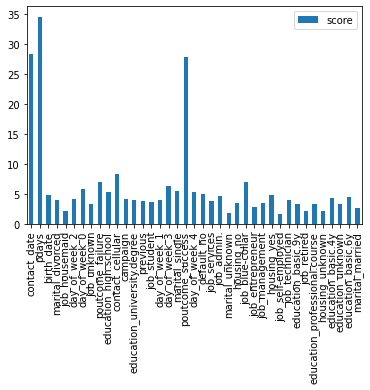

In [61]:
model.get_score(importance_type='weight')

feature_important = model.get_score(importance_type='gain')
keys = list(feature_important.keys())
values = list(feature_important.values())

scores = pd.DataFrame(data=values, index=keys, columns=["score"])
scores.plot(kind='bar')

In [62]:
importance_dict = {k : v for k, v in zip(keys, values)}

{'contact_date': 28.297513059485215, 'pdays': 34.49962917333333, 'birth_date': 4.738084909041375, 'marital_divorced': 4.00804247, 'job_housemaid': 2.0952262575, 'day_of_week_2': 4.183478853555554, 'day_of_week_0': 5.807804576583333, 'job_unknown': 3.4026303299999996, 'poutcome_failure': 6.999688455250001, 'education_high.school': 5.396207308, 'contact_cellular': 8.262109497857143, 'campaign': 4.220434153314286, 'education_university.degree': 3.9192431971428574, 'previous': 3.75902264, 'job_student': 3.5804390316666663, 'day_of_week_1': 4.047615165, 'day_of_week_3': 6.365749666666667, 'marital_single': 5.465213936666667, 'poutcome_success': 27.8263731, 'day_of_week_4': 5.266620276249999, 'default_no': 5.004715698571429, 'job_services': 3.828872776, 'job_admin.': 4.735301496666666, 'marital_unknown': 1.7650171933333336, 'housing_no': 3.4495872071428573, 'job_blue-collar': 6.9060479425, 'job_entrepreneur': 2.878840685, 'job_management': 3.53594971, 'housing_yes': 4.73621738, 'job_self-emp

Usuwamy feature'y, które najmniej wpływają na wynik.

In [63]:
for col in data.columns:
    if col not in importance_dict or importance_dict[col] < 3:
        if col != 'y' and col != 'id':
            data.drop(col, inplace=True, axis=1)

In [64]:
data[0:5]

,id,birth_date,contact_date,campaign,pdays,previous,y,marital_divorced,marital_single,job_admin.,...,poutcome_failure,poutcome_success,default_no,housing_no,housing_yes,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4
0,1,-15.953501,-9.211846,1,1.0,0,no,0,0,0,...,0,0,1,1,0,1,0,0,0,0
1,2,-16.911939,-8.536623,1,1.0,0,unknown,0,0,0,...,0,0,0,1,0,1,0,0,0,0
2,3,2.417007,-9.549458,1,1.0,0,no,0,0,0,...,0,0,1,0,1,1,0,0,0,0
3,4,-0.762908,-8.874235,1,1.0,0,unknown,0,0,1,...,0,0,1,1,0,1,0,0,0,0
4,5,-15.824833,-8.874235,1,1.0,0,unknown,0,0,0,...,0,0,1,1,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,41184,-29.392645,35.210182,1,1.0,0,unknown,0,0,0,...,0,0,1,0,1,0,0,0,0,1
41184,41185,-3.916564,34.872571,1,1.0,0,unknown,0,0,0,...,0,0,1,1,0,0,0,0,0,1
41185,41186,-13.519330,34.872571,2,1.0,0,no,0,0,0,...,0,0,1,0,1,0,0,0,0,1
41186,41187,-1.590054,35.547794,1,1.0,0,unknown,0,0,0,...,0,0,1,1,0,0,0,0,0,1


In [65]:
import numpy as np
from sklearn.model_selection import train_test_split

def split_to_subsets(data):
    '''
        Rozdziela dane na sety treningowe, walidacyjne, testowe i do predykcji oraz zamienia je w tablice numpy.
        Zwraca Xtr, Ytr, Xval, Yval, Xtest, Ytest
    '''
    data_known, labels, data_unknown, ids = prepare_train_data(data)

    Xtr, Xtest, Ytr, Ytest = train_test_split(data_known, labels, test_size=0.2, random_state=1)
    Xtr, Xval, Ytr, Yval \
        = train_test_split(Xtr, Ytr, test_size=0.25, random_state=1) # 0.25 x 0.8 = 0.2

    return Xtr, Ytr, Xval, Yval, Xtest, Ytest, ids, data_unknown


In [66]:
import tensorflow as tf
from tensorflow.keras.metrics import AUC
from tensorflow.keras import layers
from tensorflow.keras import regularizers
from tensorflow.keras.layers.experimental import preprocessing
tf.keras.backend.set_floatx('float32')

def get_compiled_model(input_size, hidden_layers):
  '''
  Zwraca skompilowany model sieci neuronowej.
  '''
  model = tf.keras.Sequential()
  model.add(tf.keras.layers.Dense(input_size, activation='sigmoid', kernel_regularizer=regularizers.l2(0.01)))
  for layer in hidden_layers:
    model.add(tf.keras.layers.Dense(layer, activation='sigmoid', kernel_regularizer=regularizers.l2(0.01)))

  model.add(tf.keras.layers.Dense(1, activation='sigmoid', kernel_regularizer=regularizers.l2(0.01)))

  model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.0006), loss=tf.keras.losses.BinaryCrossentropy(),
                metrics=[tf.keras.metrics.AUC(name='auc')])
  return model

In [67]:
def train_nn_model(compiled_model, data):
    '''
    Trenuje model tf na podstawie data.
    '''
    Xtr, Ytr, Xval, Yval, Xtest, Ytest, ids, data_unknown = split_to_subsets(data)
    # Get weights
    pos = np.count_nonzero(Ytr)
    neg = len(Ytr) - pos
    weight_for_0 = (1 / neg)*(neg + pos)/2.0 
    weight_for_1 = (1 / pos)*(neg + pos)/2.0

    class_weight = {0: weight_for_0, 1: weight_for_1}

    tf_train = tf.data.Dataset.from_tensor_slices((Xtr.values, Ytr.values)).shuffle(len(Xtr)).batch(32)
    tf_val = tf.data.Dataset.from_tensor_slices((Xval.values, Yval.values)).shuffle(len(Xval)).batch(32)
    tf_test = tf.data.Dataset.from_tensor_slices((Xtest.values, Ytest.values)).shuffle(len(Xtest)).batch(32)

    history = compiled_model.fit(tf_train, epochs=20, validation_data=tf_val, class_weight=class_weight, batch_size=32)
    return history


In [68]:
def find_best_layers(data):
    '''
    Znajduje najlepszy układ warst sieci na podstawie data.
    '''
    layer_sizes = [10, 25, 50]
    best_val_auc = 0
    best_layers = []
    for layers_no in range(3):
        possible_layers = [] 
        if layers_no == 1:
            possible_layers = [[i] for i in layer_sizes]
        if layers_no == 2:
            possible_layers = [[i, j] for i in layer_sizes for j in layer_sizes]

        for layers in possible_layers:
            model = get_compiled_model(len(Xtr), layers)
            history = train_nn_model(model, data)
            if history.history['val_auc'][-1] > best_val_auc:
                best_val_auc = history.history['val_auc'][-1]
                best_layers= layers
    return best_val_auc, best_layers


In [69]:
def predict_nn(model, data):
    '''
    Zwraca predykcję modelu dla nieznanych wartości w data.
    '''
    Xtr, Ytr, Xval, Yval, Xtest, Ytest, ids, data_unknown = split_to_subsets(data)
    dunknown = data_unknown.to_numpy()
    pred = model.predict(dunknown)
    solution = pd.DataFrame()
    solution['id'] = ids
    solution['y'] = pred
    return solution

In [70]:
def eval_nn(model, data):
    '''
    Sprawdza celność predykcji dla danych testowych w data.
    '''
    Xtr, Ytr, Xval, Yval, Xtest, Ytest, ids, data_unknown = split_to_subsets(data)
    tf_test = tf.data.Dataset.from_tensor_slices((Xtest.values, Ytest.values)).shuffle(len(Xtest)).batch(32)
    return model.evaluate(tf_test)


In [71]:
Xtr, _, _, _, _, _, _, _ = split_to_subsets(data)
tf_model = get_compiled_model(Xtr.shape[1], [50])
history = train_nn_model(tf_model, data)

Epoch 1/20

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

390/390 [==============================] - 6s 15ms/step - loss: 0.9590 - auc: 0.7233 - val_loss: 0.7230 - val_auc: 0.7594
Epoch 2/20
390/390 [==============================] - 6s 16ms/step - loss: 0.6680 - auc: 0.7636 - val_loss: 0.6487 - val_auc: 0.7618
Epoch 3/20
390/390 [==============================] - 6s 15ms/step - loss: 0.6329 - auc: 0.7687 - val_loss: 0.6736 - val_auc: 0.7618
Epoch 4/20
390/390 [==============================] - 6s 16ms/step - loss: 0.6296 - auc: 0.7636 - val_loss: 0

In [72]:
score = eval_nn(tf_model, data)

130/130 [==============================] - 2s 18ms/step - loss: 0.6089 - auc: 0.7658


In [73]:
solution = predict_nn(tf_model, data)
solution.to_csv('solutions/tf_solution.csv', index=False)

*Contact_days*, *pdays* i *success* mają największy wpływ na predykcję, narysuję wykresy od tych feature'ów.

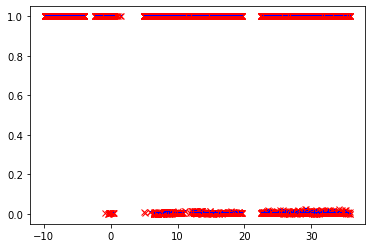

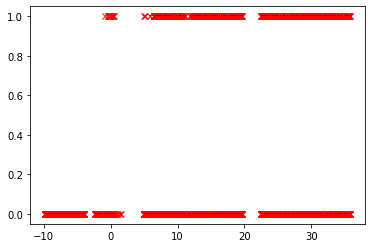

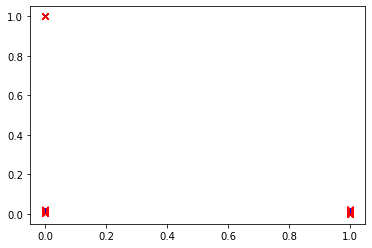

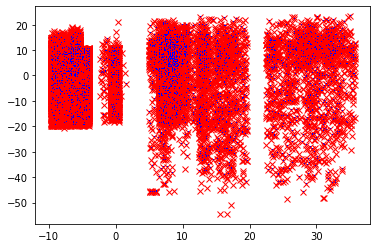

In [74]:
import matplotlib.pyplot as plt

data_positive = data[data.y == 'yes']
data_negative = data[data.y != 'no']
contact_dates_pos = data_positive['contact_date']
pdays_pos = data_positive['pdays']
success_pos = data_positive['poutcome_success']
birth_date_pos = data_positive['birth_date']

contact_dates_neg = data_negative['contact_date']
pdays_neg = data_negative['pdays']
success_neg = data_negative['poutcome_success']
birth_date_neg = data_negative['birth_date']

#plt.plot(contact_dates_neg, success_neg, 'b^', contact_dates_pos, success_pos, 'r*')

plt.plot(contact_dates_neg, pdays_neg, 'rx', contact_dates_pos, pdays_pos, 'b,')
plt.show()

plt.plot(contact_dates_neg, success_neg, 'rx', contact_dates_pos, success_pos, 'b,')
plt.show()

plt.plot(success_neg, pdays_neg, 'rx', success_pos, pdays_pos, 'b,')
plt.show()

plt.plot(contact_dates_neg, birth_date_neg, 'rx', contact_dates_pos, birth_date_pos, 'b,')
plt.show()


Niestety nie widać żadnych przydatnych zależności, na podstawie których można zrobić dodatkowe feature'y.

Tworzę nowego Dataframe'a z dodatkowymi kolumnami. Dodatkowe kolumny mają informację o odległości danej komórki w starym Dataframe'ie do średniej komórki z pozytywnym/negatwynym oznaczeniem.

In [75]:
new_data = add_distances_to_labels(data)
new_data[0:5]



,id,birth_date,contact_date,campaign,pdays,previous,y,marital_divorced,marital_single,job_admin.,...,day_of_week_0_pos_dist,day_of_week_0_neg_dist,day_of_week_1_pos_dist,day_of_week_1_neg_dist,day_of_week_2_pos_dist,day_of_week_2_neg_dist,day_of_week_3_pos_dist,day_of_week_3_neg_dist,day_of_week_4_pos_dist,day_of_week_4_neg_dist
0,1,-15.953501,-9.211846,1,1.0,0,no,0,0,0,...,0.82521,0.793148,0.186555,0.194962,0.218067,0.199577,0.232353,0.206472,0.188235,0.192139
1,2,-16.911939,-8.536623,1,1.0,0,unknown,0,0,0,...,0.82521,0.793148,0.186555,0.194962,0.218067,0.199577,0.232353,0.206472,0.188235,0.192139
2,3,2.417007,-9.549458,1,1.0,0,no,0,0,0,...,0.82521,0.793148,0.186555,0.194962,0.218067,0.199577,0.232353,0.206472,0.188235,0.192139
3,4,-0.762908,-8.874235,1,1.0,0,unknown,0,0,1,...,0.82521,0.793148,0.186555,0.194962,0.218067,0.199577,0.232353,0.206472,0.188235,0.192139
4,5,-15.824833,-8.874235,1,1.0,0,unknown,0,0,0,...,0.82521,0.793148,0.186555,0.194962,0.218067,0.199577,0.232353,0.206472,0.188235,0.192139


Wytrenuję modele sieci i xgb na nowych danych.

In [76]:
Xtr, _, _, _, _, _, _, _ = split_to_subsets(new_data)
tf_model2 = get_compiled_model(Xtr.shape[1], [50])
history = train_nn_model(tf_model2, new_data)

Epoch 1/20

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

390/390 [==============================] - 6s 16ms/step - loss: 1.1177 - auc: 0.7484 - val_loss: 0.6798 - val_auc: 0.7647
Epoch 2/20
390/390 [==============================] - 14s 35ms/step - loss: 0.6558 - auc: 0.7650 - val_loss: 0.6363 - val_auc: 0.7678
Epoch 3/20
390/390 [==============================] - 21s 54ms/step - loss: 0.6248 - auc: 0.7649 - val_loss: 0.5915 - val_auc: 0.7686
Epoch 4/20
390/390 [==============================] - 9s 23ms/step - loss: 0.6179 - auc: 0.7658 - val_loss:

In [77]:
eval_nn(tf_model2, data=new_data)

130/130 [==============================] - 2s 12ms/step - loss: 0.5365 - auc: 0.7693


[0.5364778637886047, 0.7692862153053284]

In [78]:
solution = predict_nn(tf_model2, new_data)
solution.to_csv('solutions/tf_solution2.csv', index=False)


In [79]:
from skopt import forest_minimize
from sklearn.model_selection import cross_val_score

def tune_xgbc(params, X, Y):
    """
    Znajduje auc po 5-fold walidacji dla danych parametrów
    """
    #Hyperparameters to be optimized
    print(params)
    learning_rate = params[0] 
    n_estimators = params[1] 
    max_depth = params[2]
    min_child_weight = params[3]
    gamma = params[4]
    subsample = params[5]
    colsample_bytree = params[6]


    mdl = xgb.XGBClassifier(learning_rate = learning_rate, 
        n_estimators = n_estimators, 
        max_depth = max_depth, 
        min_child_weight = min_child_weight, 
        gamma = gamma, 
        subsample = subsample, 
        colsample_bytree = colsample_bytree, seed = 42)


    auc = cross_val_score(mdl, X, Y, scoring = 'roc_auc')

    return -auc.mean()


#result = forest_minimize(tune_xgbc, space, random_state = 42, n_random_starts = 20, n_calls  = 25, verbose = 1)
#najlepsze parametry : [0.002895927274708839, 191, 7, 4.049983288913105, 0.4165974558680823, 0.5866823267538861, 0.6955303037866205]

In [80]:
def train_xgb_params(data):
    '''
    Trenuje model xgb na podstawie danych w data z parametrami param.
    '''
    Xtr, Ytr, Xval, Yval, Xtest, Ytest, ids, data_unknown = split_to_subsets(data)
    # Parametry dobieramy za pomocą 5-fold walidacji, więc sety treningowe i walidacyjne można scalić.
    X = pd.concat([Xtr, Xval])
    Y = pd.concat([Ytr, Yval])
    dtrain = xgb.DMatrix(X, label=Y)
    dtest = xgb.DMatrix(Xtest, label=Ytest)
  
    space = [(1e-3, 1e-2, 'log-uniform'), # learning rate
          (100, 1000), # n_estimators
          (2, 10), # max_depth 
          (1, 10.), # min_child_weight 
          (0, 0.5), # gamma 
          (0.5, 1.), # subsample 
          (0.5, 1.)] # colsample_bytree 

    fun = lambda param : tune_xgbc(param, X, Y)
    result = forest_minimize(fun, space, random_state = 42, n_random_starts = 20, n_calls  = 30, verbose = 1)
    params = result['x']
    learning_rate = params[0] 
    n_estimators = params[1] 
    max_depth = params[2]
    min_child_weight = params[3]
    gamma = params[4]
    subsample = params[5]
    colsample_bytree = params[6]

    param = {'eta': learning_rate, 'n_estimators' : n_estimators, 'max_depth': max_depth, 
        'min_child_weight' : min_child_weight, 'gamma' : gamma, 'subsample' : subsample,
        'colsample_bytree' : colsample_bytree, 'eval_metric' : 'auc', 'objective': 'binary:logistic'}
    

    return param

In [81]:
def get_xgb_model(data, param):
    '''
    Zaraca model xgb wytrenowany na danych w data i z parametrami param.
    '''
    Xtr, Ytr, Xval, Yval, Xtest, Ytest, ids, data_unknown = split_to_subsets(data)
    # Można połączyć sety walidacyjne i treningowe, bo użyliśmy 5-fold validation.
    dtrain = xgb.DMatrix(pd.concat([Xtr, Xval]), label=pd.concat([Ytr, Yval]))
    dtest = xgb.DMatrix(Xtest, label=Ytest)
    evallist = [(dtrain, 'train'), (dtest, 'test')]
    num_round = 600
    bst = xgb.train(param, dtrain, num_round, evallist)
    return bst


Znajdujemy najlepsze parametry dla starych danych (bez odległości).

In [82]:
#params = train_xgb_params(data)
params = {'eta': 0.0015911796004861238, 'n_estimators' : 963, 'max_depth': 8, 
        'min_child_weight' : 5.278332008639007, 'gamma' : 0.2816377859881919, 'subsample' : 0.8477580432130638,
        'colsample_bytree' : 0.5696657272029378, 'eval_metric' : 'auc', 'objective': 'binary:logistic'}
#najlepsze parametry: [0.0015911796004861238, 963, 8, 5.278332008639007, 0.2816377859881919, 0.8477580432130638, 0.5696657272029378]

In [83]:
xgb_model = get_xgb_model(data, params)

ain-auc:0.79843	test-auc:0.78437
[113]	train-auc:0.79848	test-auc:0.78436
[114]	train-auc:0.79841	test-auc:0.78433
[115]	train-auc:0.79843	test-auc:0.78436
[116]	train-auc:0.79841	test-auc:0.78432
[117]	train-auc:0.79847	test-auc:0.78428
[118]	train-auc:0.79853	test-auc:0.78435
[119]	train-auc:0.79859	test-auc:0.78437
[120]	train-auc:0.79844	test-auc:0.78428
[121]	train-auc:0.79847	test-auc:0.78428
[122]	train-auc:0.79850	test-auc:0.78433
[123]	train-auc:0.79860	test-auc:0.78417
[124]	train-auc:0.79860	test-auc:0.78420
[125]	train-auc:0.79867	test-auc:0.78418
[126]	train-auc:0.79872	test-auc:0.78417
[127]	train-auc:0.79870	test-auc:0.78412
[128]	train-auc:0.79871	test-auc:0.78410
[129]	train-auc:0.79879	test-auc:0.78417
[130]	train-auc:0.79886	test-auc:0.78425
[131]	train-auc:0.79882	test-auc:0.78420
[132]	train-auc:0.79877	test-auc:0.78409
[133]	train-auc:0.79881	test-auc:0.78425
[134]	train-auc:0.79881	test-auc:0.78424
[135]	train-auc:0.79884	test-auc:0.78424
[136]	train-auc:0.79879	

In [84]:
def predict_xgb(model, data):
    '''
    Zwraca predykcję model dla nieznanych danych w data.
    '''
    Xtr, Ytr, Xval, Yval, Xtest, Ytest, ids, data_unknown = split_to_subsets(data)
    dunknown = xgb.DMatrix(data_unknown)
    pred = model.predict(dunknown)
    solution = pd.DataFrame()
    solution['id'] = ids
    solution['y'] = pred
    return solution


In [85]:
solution = predict_xgb(xgb_model, data)
solution.to_csv('solutions/xgboost_solution.csv', index=False)


Teraz trenuję na danych z odległościami.

In [86]:
#params2 = train_xgb_params(new_data)
params2 = {'eta': 00.0014906121385323268, 'n_estimators' : 1204, 'max_depth': 5, 
        'min_child_weight' : 2.6401247900925613, 'gamma' : 0.37768070515882635, 'subsample' : 0.7125779372456225,
        'colsample_bytree' : 0.6039708314340945, 'eval_metric' : 'auc', 'objective': 'binary:logistic'}
#najlepsze znalezione parametry: [0.0014906121385323268, 1204, 5, 2.6401247900925613, 0.37768070515882635, 0.7125779372456225, 0.6039708314340945]

In [87]:
xgb_model2 = get_xgb_model(new_data, params2)

ain-auc:0.79649	test-auc:0.78760
[113]	train-auc:0.79650	test-auc:0.78758
[114]	train-auc:0.79660	test-auc:0.78765
[115]	train-auc:0.79692	test-auc:0.78740
[116]	train-auc:0.79700	test-auc:0.78735
[117]	train-auc:0.79700	test-auc:0.78736
[118]	train-auc:0.79713	test-auc:0.78756
[119]	train-auc:0.79710	test-auc:0.78750
[120]	train-auc:0.79741	test-auc:0.78792
[121]	train-auc:0.79744	test-auc:0.78799
[122]	train-auc:0.79741	test-auc:0.78800
[123]	train-auc:0.79733	test-auc:0.78785
[124]	train-auc:0.79734	test-auc:0.78785
[125]	train-auc:0.79734	test-auc:0.78784
[126]	train-auc:0.79731	test-auc:0.78775
[127]	train-auc:0.79719	test-auc:0.78773
[128]	train-auc:0.79719	test-auc:0.78773
[129]	train-auc:0.79721	test-auc:0.78773
[130]	train-auc:0.79757	test-auc:0.78753
[131]	train-auc:0.79753	test-auc:0.78750
[132]	train-auc:0.79772	test-auc:0.78760
[133]	train-auc:0.79773	test-auc:0.78762
[134]	train-auc:0.79772	test-auc:0.78761
[135]	train-auc:0.79771	test-auc:0.78763
[136]	train-auc:0.79771	

In [88]:
solution = predict_xgb(xgb_model2, new_data)
solution.to_csv('solutions/xgboost_solution2.csv', index=False)

Dodam feature'y wielomianowe stopnia 2 (tworzę nową kolumnę dla każdej pary kolumn z iloczynami ich wartości).

In [89]:
from sklearn.preprocessing import PolynomialFeatures
poly_data = data.copy()
y = poly_data['y']
ids = poly_data['id']
poly_data.drop('y', inplace=True, axis=1)
poly_data.drop('id', inplace=True, axis=1)
data_np = poly_data.to_numpy()

poly = PolynomialFeatures(2)
data_np = poly.fit_transform(data_np)
poly_data = pd.DataFrame(data=data_np)


In [90]:
poly_data['y'] = y
poly_data['id'] = ids

Jest dużo feature'ów, więc ponownie wytrenuję prosty model i sprawdzę, które nie są potrzebne do wykonania predykcji.

In [91]:
import xgboost as xgb
data_known, labels, data_unknown, ids = prepare_train_data(poly_data)

dtrain = xgb.DMatrix(data_known, label=labels)
evallist = [(dtrain, 'train')]
num_round = 30
model = xgb.train(param, dtrain, num_round, evallist)

[0]	train-auc:0.77377
[1]	train-auc:0.77624
[2]	train-auc:0.78944
[3]	train-auc:0.80062
[4]	train-auc:0.80405
[5]	train-auc:0.80767
[6]	train-auc:0.81639
[7]	train-auc:0.82160
[8]	train-auc:0.82829
[9]	train-auc:0.83872
[10]	train-auc:0.84226
[11]	train-auc:0.84832
[12]	train-auc:0.85305
[13]	train-auc:0.85480
[14]	train-auc:0.85578
[15]	train-auc:0.85704
[16]	train-auc:0.85914
[17]	train-auc:0.86125
[18]	train-auc:0.86198
[19]	train-auc:0.86347
[20]	train-auc:0.86421
[21]	train-auc:0.86505
[22]	train-auc:0.86632
[23]	train-auc:0.86719
[24]	train-auc:0.86776
[25]	train-auc:0.86846
[26]	train-auc:0.87100
[27]	train-auc:0.87145
[28]	train-auc:0.87145
[29]	train-auc:0.87145


In [92]:
feature_important = model.get_score(importance_type='gain')
keys = list(feature_important.keys())
for i in range(len(keys)):
   keys[i] = int(keys[i])

keys.append('y')
keys.append('id')

In [93]:
poly_data = poly_data[keys]

In [94]:
poly_data = add_distances_to_labels(poly_data)

In [95]:
#params = train_xgb_params(poly_data)
params = {'eta': 0.0039020945438554325, 'n_estimators' : 825, 'max_depth': 4, 
        'min_child_weight' : 5.249934326457544, 'gamma' : 0.059797122969150865, 'subsample' : 0.8566223936114976,
        'colsample_bytree' : 0.8803925243084488, 'eval_metric' : 'auc', 'objective': 'binary:logistic'}

#best found params: [0.0039020945438554325, 825, 4, 5.249934326457544, 0.059797122969150865, 0.8566223936114976, 0.8803925243084488]

In [96]:
poly_xgb_model = get_xgb_model(poly_data, params)

ain-auc:0.80461	test-auc:0.79104
[113]	train-auc:0.80460	test-auc:0.79118
[114]	train-auc:0.80458	test-auc:0.79120
[115]	train-auc:0.80460	test-auc:0.79119
[116]	train-auc:0.80469	test-auc:0.79104
[117]	train-auc:0.80473	test-auc:0.79113
[118]	train-auc:0.80470	test-auc:0.79111
[119]	train-auc:0.80466	test-auc:0.79115
[120]	train-auc:0.80464	test-auc:0.79139
[121]	train-auc:0.80465	test-auc:0.79140
[122]	train-auc:0.80463	test-auc:0.79139
[123]	train-auc:0.80470	test-auc:0.79158
[124]	train-auc:0.80473	test-auc:0.79156
[125]	train-auc:0.80469	test-auc:0.79132
[126]	train-auc:0.80470	test-auc:0.79133
[127]	train-auc:0.80471	test-auc:0.79132
[128]	train-auc:0.80491	test-auc:0.79128
[129]	train-auc:0.80490	test-auc:0.79128
[130]	train-auc:0.80495	test-auc:0.79124
[131]	train-auc:0.80493	test-auc:0.79125
[132]	train-auc:0.80487	test-auc:0.79130
[133]	train-auc:0.80511	test-auc:0.79132
[134]	train-auc:0.80511	test-auc:0.79134
[135]	train-auc:0.80510	test-auc:0.79133
[136]	train-auc:0.80532	

In [97]:
# ostateczne rozwiązanie.
solution = predict_xgb(poly_xgb_model, poly_data)
solution.to_csv('solutions/xgboost_poly_solution.csv', index=False)